In [1]:
import numpy as np
import pandas as pd
import sys
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import style
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import time
import random
from tqdm import *
from math import *
import operator
from sklearn.preprocessing import LabelEncoder
from sklearn import model_selection
pd.__version__
import seaborn as sns

In [15]:
f_read= pd.read_csv("/Users/amitpatel/Downloads/Complaint_Analysis.csv")

In [16]:
f_read

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Garage Lot Name,Ferry Direction,Ferry Terminal Name,Latitude,Longitude,Location
0,32310363,12/31/2015 23:59,1/1/2016 0:55,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Music/Party,Street/Sidewalk,10034.0,71 VERMILYEA AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.865682,-73.923501,"(40.86568153633767, -73.92350095571744)"
1,32309934,12/31/2015 23:59,1/1/2016 1:26,NYPD,New York City Police Department,Blocked Driveway,No Access,Street/Sidewalk,11105.0,27-07 23 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.775945,-73.915094,"(40.775945312321085, -73.91509393898605)"
2,32309159,12/31/2015 23:59,1/1/2016 4:51,NYPD,New York City Police Department,Blocked Driveway,No Access,Street/Sidewalk,10458.0,2897 VALENTINE AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.870325,-73.888525,"(40.870324522111424, -73.88852464418646)"
3,32305098,12/31/2015 23:57,1/1/2016 7:43,NYPD,New York City Police Department,Illegal Parking,Commercial Overnight Parking,Street/Sidewalk,10461.0,2940 BAISLEY AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.835994,-73.828379,"(40.83599404683083, -73.82837939584206)"
4,32306529,12/31/2015 23:56,1/1/2016 3:24,NYPD,New York City Police Department,Illegal Parking,Blocked Sidewalk,Street/Sidewalk,11373.0,87-14 57 ROAD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.733060,-73.874170,"(40.733059618956815, -73.87416975810375)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364553,29609918,1/1/2015 0:04,1/1/2015 10:22,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,11421.0,84-25 85 ROAD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.695145,-73.860949,"(40.69514470265117, -73.86094888534394)"
364554,29608392,1/1/2015 0:04,1/1/2015 2:25,NYPD,New York City Police Department,Noise - Vehicle,Car/Truck Horn,Street/Sidewalk,10468.0,2555 SEDGWICK AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.867830,-73.907178,"(40.86782963689454, -73.90717786644662)"
364555,29607589,1/1/2015 0:01,1/1/2015 0:20,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Music/Party,Street/Sidewalk,10031.0,508 WEST 139 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.821647,-73.950873,"(40.821646626438095, -73.95087342885292)"
364556,29610889,1/1/2015 0:01,1/1/2015 2:42,NYPD,New York City Police Department,Blocked Driveway,No Access,Street/Sidewalk,10466.0,931 EAST 226 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.886361,-73.853290,"(40.88636077906953, -73.85329048666742)"


In [17]:
f_read.head()

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Garage Lot Name,Ferry Direction,Ferry Terminal Name,Latitude,Longitude,Location
0,32310363,12/31/2015 23:59,1/1/2016 0:55,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Music/Party,Street/Sidewalk,10034.0,71 VERMILYEA AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.865682,-73.923501,"(40.86568153633767, -73.92350095571744)"
1,32309934,12/31/2015 23:59,1/1/2016 1:26,NYPD,New York City Police Department,Blocked Driveway,No Access,Street/Sidewalk,11105.0,27-07 23 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.775945,-73.915094,"(40.775945312321085, -73.91509393898605)"
2,32309159,12/31/2015 23:59,1/1/2016 4:51,NYPD,New York City Police Department,Blocked Driveway,No Access,Street/Sidewalk,10458.0,2897 VALENTINE AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.870325,-73.888525,"(40.870324522111424, -73.88852464418646)"
3,32305098,12/31/2015 23:57,1/1/2016 7:43,NYPD,New York City Police Department,Illegal Parking,Commercial Overnight Parking,Street/Sidewalk,10461.0,2940 BAISLEY AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.835994,-73.828379,"(40.83599404683083, -73.82837939584206)"
4,32306529,12/31/2015 23:56,1/1/2016 3:24,NYPD,New York City Police Department,Illegal Parking,Blocked Sidewalk,Street/Sidewalk,11373.0,87-14 57 ROAD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.733060,-73.874170,"(40.733059618956815, -73.87416975810375)"


In [18]:
f_read.tail()

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Garage Lot Name,Ferry Direction,Ferry Terminal Name,Latitude,Longitude,Location
364553,29609918,1/1/2015 0:04,1/1/2015 10:22,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,11421.0,84-25 85 ROAD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.695145,-73.860949,"(40.69514470265117, -73.86094888534394)"
364554,29608392,1/1/2015 0:04,1/1/2015 2:25,NYPD,New York City Police Department,Noise - Vehicle,Car/Truck Horn,Street/Sidewalk,10468.0,2555 SEDGWICK AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.867830,-73.907178,"(40.86782963689454, -73.90717786644662)"
364555,29607589,1/1/2015 0:01,1/1/2015 0:20,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Music/Party,Street/Sidewalk,10031.0,508 WEST 139 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.821647,-73.950873,"(40.821646626438095, -73.95087342885292)"
364556,29610889,1/1/2015 0:01,1/1/2015 2:42,NYPD,New York City Police Department,Blocked Driveway,No Access,Street/Sidewalk,10466.0,931 EAST 226 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.886361,-73.853290,"(40.88636077906953, -73.85329048666742)"
364557,29611816,1/1/2015 0:00,1/1/2015 2:47,NYPD,New York City Police Department,Blocked Driveway,No Access,Street/Sidewalk,11420.0,123-19 135 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.674212,-73.803585,"(40.674211762243935, -73.80358548685278)"


<AxesSubplot:>

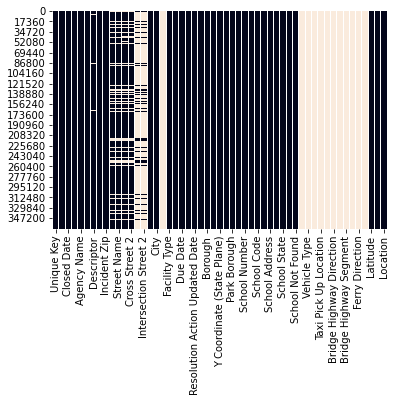

In [19]:
sns.heatmap(f_read.isnull(), cbar=False)

<AxesSubplot:>

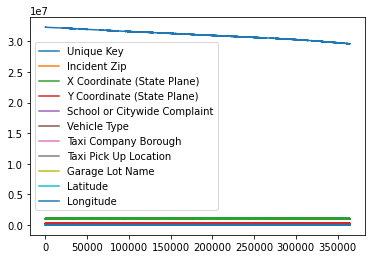

In [20]:
#ploting directly based on index number
f_read.plot()

In [21]:
#Analysing Categorical data(Typical method)

In [22]:
column_list = f_read.columns

In [23]:
new_col_list = []
for i in column_list:
    new_col_list.append(i.replace(" ","_"))

In [24]:
f_read.columns = new_col_list

In [25]:
f_read.columns

Index(['Unique_Key', 'Created_Date', 'Closed_Date', 'Agency', 'Agency_Name',
       'Complaint_Type', 'Descriptor', 'Location_Type', 'Incident_Zip',
       'Incident_Address', 'Street_Name', 'Cross_Street_1', 'Cross_Street_2',
       'Intersection_Street_1', 'Intersection_Street_2', 'Address_Type',
       'City', 'Landmark', 'Facility_Type', 'Status', 'Due_Date',
       'Resolution_Description', 'Resolution_Action_Updated_Date',
       'Community_Board', 'Borough', 'X_Coordinate_(State_Plane)',
       'Y_Coordinate_(State_Plane)', 'Park_Facility_Name', 'Park_Borough',
       'School_Name', 'School_Number', 'School_Region', 'School_Code',
       'School_Phone_Number', 'School_Address', 'School_City', 'School_State',
       'School_Zip', 'School_Not_Found', 'School_or_Citywide_Complaint',
       'Vehicle_Type', 'Taxi_Company_Borough', 'Taxi_Pick_Up_Location',
       'Bridge_Highway_Name', 'Bridge_Highway_Direction', 'Road_Ramp',
       'Bridge_Highway_Segment', 'Garage_Lot_Name', 'Ferry_

Find unique values

In [26]:
f_read["Address_Type"].unique()

array(['ADDRESS', nan, 'INTERSECTION', 'LATLONG', 'BLOCKFACE',
       'PLACENAME'], dtype=object)

In [27]:
f_read["Address_Type"].nunique()

5

In [28]:
f_read["Address_Type"].value_counts()

ADDRESS         292699
INTERSECTION     50514
BLOCKFACE        13786
LATLONG           3931
PLACENAME          376
Name: Address_Type, dtype: int64

In [29]:
complaint_list = f_read['Complaint_Type'].unique

In [30]:
complaint_list

<bound method Series.unique of 0         Noise - Street/Sidewalk
1                Blocked Driveway
2                Blocked Driveway
3                 Illegal Parking
4                 Illegal Parking
                   ...           
364553            Illegal Parking
364554            Noise - Vehicle
364555    Noise - Street/Sidewalk
364556           Blocked Driveway
364557           Blocked Driveway
Name: Complaint_Type, Length: 364558, dtype: object>

In [31]:
f_read['Complaint_Type'].nunique()

24

In [32]:
f_read["Complaint_Type"].value_counts()

Blocked Driveway             100881
Illegal Parking               92679
Noise - Street/Sidewalk       51692
Noise - Commercial            44109
Derelict Vehicle              21661
Noise - Vehicle               19352
Animal Abuse                  10541
Traffic                        5198
Homeless Encampment            4879
Vending                        4192
Noise - Park                   4109
Drinking                       1409
Noise - House of Worship       1070
Posting Advertisement           681
Urinating in Public             641
Bike/Roller/Skate Chronic       478
Panhandling                     327
Disorderly Youth                315
Illegal Fireworks               172
Graffiti                        157
Agency Issues                     8
Squeegee                          4
Ferry Complaint                   2
Animal in a Park                  1
Name: Complaint_Type, dtype: int64

In [33]:
city_complaint_type = f_read.groupby(['City','Complaint_Type'])

In [34]:
#Display the complaint type and city together

In [35]:
city_complaint_type.size()

City      Complaint_Type         
ARVERNE   Animal Abuse                46
          Blocked Driveway            50
          Derelict Vehicle            32
          Disorderly Youth             2
          Drinking                     1
                                    ... 
Woodside  Blocked Driveway            27
          Derelict Vehicle             8
          Illegal Parking            124
          Noise - Commercial           2
          Noise - Street/Sidewalk      5
Length: 777, dtype: int64

In [36]:
complaint_type = f_read.groupby('Complaint_Type')

In [37]:
complaint_analysis = complaint_type.size()
df =  complaint_analysis.to_frame().reset_index()

In [38]:
df.columns = ['Complaint_type','FREQ']
df.columns

Index(['Complaint_type', 'FREQ'], dtype='object')

In [39]:
sort_1 = df.sort_values('FREQ',ascending=False)
sort_1

,Complaint_type,FREQ
4,Blocked Driveway,100881
12,Illegal Parking,92679
16,Noise - Street/Sidewalk,51692
13,Noise - Commercial,44109
5,Derelict Vehicle,21661
17,Noise - Vehicle,19352
1,Animal Abuse,10541
21,Traffic,5198
10,Homeless Encampment,4879
23,Vending,4192


In [40]:
top10 = sort_1.head(25)
top10

,Complaint_type,FREQ
4,Blocked Driveway,100881
12,Illegal Parking,92679
16,Noise - Street/Sidewalk,51692
13,Noise - Commercial,44109
5,Derelict Vehicle,21661
17,Noise - Vehicle,19352
1,Animal Abuse,10541
21,Traffic,5198
10,Homeless Encampment,4879
23,Vending,4192


# Visualize the complaint type

x=range(25)
plt.bar(top10.Complaint_type, top10.FREQ)
plt.xticks(x, top10.Complaint_type, rotation='vertical')
plt.legend(['Complaint'])
plt.show()

In [42]:
city_complaint_type =  f_read.groupby(["City", "Complaint_Type"])
complaint_analysis_city = city_complaint_type.size()

In [43]:
complaint_analysis_city

City      Complaint_Type         
ARVERNE   Animal Abuse                46
          Blocked Driveway            50
          Derelict Vehicle            32
          Disorderly Youth             2
          Drinking                     1
                                    ... 
Woodside  Blocked Driveway            27
          Derelict Vehicle             8
          Illegal Parking            124
          Noise - Commercial           2
          Noise - Street/Sidewalk      5
Length: 777, dtype: int64

In [44]:
df = complaint_analysis_city.to_frame().reset_index()

In [45]:
df

,City,Complaint_Type,0
0,ARVERNE,Animal Abuse,46
1,ARVERNE,Blocked Driveway,50
2,ARVERNE,Derelict Vehicle,32
3,ARVERNE,Disorderly Youth,2
4,ARVERNE,Drinking,1
...,...,...,...
772,Woodside,Blocked Driveway,27
773,Woodside,Derelict Vehicle,8
774,Woodside,Illegal Parking,124
775,Woodside,Noise - Commercial,2


In [46]:
df.columns=["Complaint_Type","City",0]

In [47]:
df.columns

Index(['Complaint_Type', 'City', 0], dtype='object')

In [48]:
sort_1 = df.sort_values(0,ascending=False)
sort_1

,Complaint_Type,City,0
105,BROOKLYN,Blocked Driveway,36447
112,BROOKLYN,Illegal Parking,33533
468,NEW YORK,Noise - Street/Sidewalk,22252
465,NEW YORK,Noise - Commercial,18692
85,BRONX,Blocked Driveway,17063
...,...,...,...
264,FOREST HILLS,Noise - House of Worship,1
678,SPRINGFIELD GARDENS,Noise - Park,1
677,SPRINGFIELD GARDENS,Noise - House of Worship,1
261,FOREST HILLS,Illegal Fireworks,1


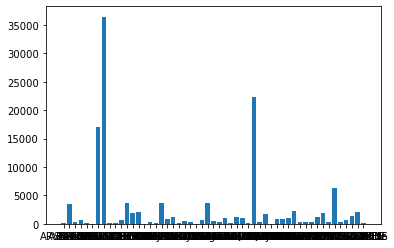

In [49]:
a=plt.bar(df["Complaint_Type"],df[0])

In [50]:
f_read.dtypes

Unique_Key                          int64
Created_Date                       object
Closed_Date                        object
Agency                             object
Agency_Name                        object
Complaint_Type                     object
Descriptor                         object
Location_Type                      object
Incident_Zip                      float64
Incident_Address                   object
Street_Name                        object
Cross_Street_1                     object
Cross_Street_2                     object
Intersection_Street_1              object
Intersection_Street_2              object
Address_Type                       object
City                               object
Landmark                           object
Facility_Type                      object
Status                             object
Due_Date                           object
Resolution_Description             object
Resolution_Action_Updated_Date     object
Community_Board                   

In [51]:
#converting into date format

In [102]:
f_read['Created_Date'] = pd.to_datetime(f_read.Created_Date)
f_read['Closed_Date'] = pd.to_datetime(f_read.Closed_Date)
f_read['Due_Date'] = pd.to_datetime(f_read.Due_Date)
f_read['Resolution_Action_Upd_Date'] = pd.to_datetime(f_read.Resolution_Action_Updated_Date)

In [103]:
f_read['call_closing_time'] = (f_read['Closed_Date']-f_read['Created_Date']).dt.seconds/3600

In [104]:
f_read['Resolution_time'] = (f_read['Resolution_Action_Upd_Date']-f_read['Created_Date']).dt.seconds/3600

In [105]:
f_read['call_closing_time'] 

0          0.933333
1          1.450000
2          4.866667
3          7.766667
4          3.466667
            ...    
364553    10.300000
364554     2.350000
364555     0.316667
364556     2.683333
364557     2.783333
Name: call_closing_time, Length: 364558, dtype: float64

In [106]:
f_read.isnull().sum()

Unique_Key                             0
Created_Date                           0
Closed_Date                         2381
Agency                                 0
Agency_Name                            0
Complaint_Type                         0
Descriptor                          6501
Location_Type                          0
Incident_Zip                        2998
Incident_Address                   51699
Street_Name                        51699
Cross_Street_1                     57188
Cross_Street_2                     57805
Intersection_Street_1             313438
Intersection_Street_2             314046
Address_Type                        3252
City                                   0
Landmark                          364183
Facility_Type                          0
Status                                 0
Due_Date                               3
Resolution_Description                 0
Resolution_Action_Updated_Date      2402
Community_Board                        0
Borough         

In [107]:
f_read['City']=f_read['City'].fillna('Unknown')
a=f_read['Facility_Type'].mode()[0]

In [108]:
f_read['City']=f_read['City'].fillna('Unknown')
a=f_read['Facility_Type'].mode()[0]
f_read['Facility_Type']=f_read['Facility_Type'].fillna(a)
f_read['Location_Type']=f_read['Location_Type'].fillna(f_read['Facility_Type'].mode()[0])

#data_set['Facility_Type']=data_set['Facility_Type'].fillna(data_set['Facility_Type'].mode()[0])
#data_set['Location_Type']=data_set['Location_Type'].fillna(data_set['Location_Type'].mode()[0])

In [109]:
f_read['Facility_Type'] = f_read['Facility_Type'].fillna(a)

In [110]:
f_read['Location_Type'] = f_read['Location_Type'].fillna(f_read['Facility_Type'].mode()[0])



In [123]:
f_read['Address_Type'] = f_read['Address_Type'].fillna(f_read['Address_Type'].mode()[0])



<AxesSubplot:>

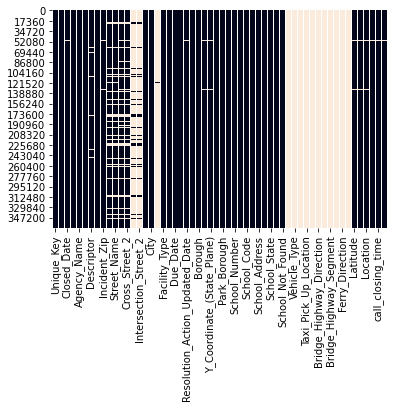

In [124]:
sns.heatmap(f_read.isnull(), cbar=False)

In [125]:
data_set=f_read.loc[:,["Complaint_Type","Location_Type","Address_Type","Facility_Type","City","Status","call_closing_time","Resolution_time"]].copy()

In [126]:
data_set

,Complaint_Type,Location_Type,Address_Type,Facility_Type,City,Status,call_closing_time,Resolution_time
0,Noise - Street/Sidewalk,Street/Sidewalk,ADDRESS,Precinct,NEW YORK,Closed,0.933333,0.933333
1,Blocked Driveway,Street/Sidewalk,ADDRESS,Precinct,ASTORIA,Closed,1.450000,1.450000
2,Blocked Driveway,Street/Sidewalk,ADDRESS,Precinct,BRONX,Closed,4.866667,4.866667
3,Illegal Parking,Street/Sidewalk,ADDRESS,Precinct,BRONX,Closed,7.766667,7.766667
4,Illegal Parking,Street/Sidewalk,ADDRESS,Precinct,ELMHURST,Closed,3.466667,3.466667
...,...,...,...,...,...,...,...,...
364553,Illegal Parking,Street/Sidewalk,ADDRESS,Precinct,WOODHAVEN,Closed,10.300000,10.300000
364554,Noise - Vehicle,Street/Sidewalk,ADDRESS,Precinct,BRONX,Closed,2.350000,2.350000
364555,Noise - Street/Sidewalk,Street/Sidewalk,ADDRESS,Precinct,NEW YORK,Closed,0.316667,0.316667
364556,Blocked Driveway,Street/Sidewalk,ADDRESS,Precinct,BRONX,Closed,2.683333,2.683333


In [127]:
data_set.head()

,Complaint_Type,Location_Type,Address_Type,Facility_Type,City,Status,call_closing_time,Resolution_time
0,Noise - Street/Sidewalk,Street/Sidewalk,ADDRESS,Precinct,NEW YORK,Closed,0.933333,0.933333
1,Blocked Driveway,Street/Sidewalk,ADDRESS,Precinct,ASTORIA,Closed,1.450000,1.450000
2,Blocked Driveway,Street/Sidewalk,ADDRESS,Precinct,BRONX,Closed,4.866667,4.866667
3,Illegal Parking,Street/Sidewalk,ADDRESS,Precinct,BRONX,Closed,7.766667,7.766667
4,Illegal Parking,Street/Sidewalk,ADDRESS,Precinct,ELMHURST,Closed,3.466667,3.466667


In [128]:

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder



In [129]:
lbe=LabelEncoder() 

In [130]:
#data_set['Agency']=lbe.fit_transform(data_set['Agency'])
data_set['Complaint_Type']=lbe.fit_transform(data_set['Complaint_Type'])


In [131]:
data_set['Location_Type']=lbe.fit_transform(data_set['Location_Type'])


In [132]:
data_set['City']=lbe.fit_transform(data_set['City'])


In [133]:
data_set['Facility_Type']=lbe.fit_transform(data_set['Facility_Type'])


In [134]:
data_set['Status']=lbe.fit_transform(data_set['Status'])

In [135]:
data_set['Address_Type']=lbe.fit_transform(data_set['Address_Type'])

In [136]:
data_set.head()

,Complaint_Type,Location_Type,Address_Type,Facility_Type,City,Status,call_closing_time,Resolution_time
0,16,15,0,0,33,1,0.933333,0.933333
1,4,15,0,0,1,1,1.450000,1.450000
2,4,15,0,0,6,1,4.866667,4.866667
3,12,15,0,0,6,1,7.766667,7.766667
4,12,15,0,0,13,1,3.466667,3.466667


In [137]:
data_set.describe()

,Complaint_Type,Location_Type,Address_Type,Facility_Type,City,Status,call_closing_time,Resolution_time
count,364558.000000,364558.00000,364558.000000,364558.0,364558.000000,364558.000000,362177.000000,362156.000000
mean,10.271307,13.88279,0.351415,0.0,19.757262,1.006803,3.860239,3.859210
std,5.301311,3.42997,0.762970,0.0,15.153827,0.141963,3.785565,3.785543
min,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
25%,4.000000,15.00000,0.000000,0.0,7.000000,1.000000,1.250000,1.250000
50%,12.000000,15.00000,0.000000,0.0,11.000000,1.000000,2.650000,2.650000
75%,13.000000,15.00000,0.000000,0.0,33.000000,1.000000,5.166667,5.166667
max,23.000000,18.00000,4.000000,0.0,53.000000,3.000000,23.983333,23.983333


In [138]:
data_set.dtypes

Complaint_Type         int64
Location_Type          int64
Address_Type           int64
Facility_Type          int64
City                   int64
Status                 int64
call_closing_time    float64
Resolution_time      float64
dtype: object

In [139]:
data_set["Time_bucket"]= np.where(data_set["Resolution_time"]<1,0,
                                 np.where(data_set["Resolution_time"]<3,1,
                                         np.where(data_set["Resolution_time"]<6,2,
                                                 np.where(data_set["Resolution_time"]<10,3,
                                                         np.where(data_set["Resolution_time"]<12,4,
                                                                 np.where(data_set["Resolution_time"]<24,5,
                                                                         np.where(data_set["Resolution_time"]<36,6,7))
                                                                 )))))

In [140]:
data_set = data_set.dropna(how='any',axis=0) 

In [141]:
data_set.isnull().sum()

Complaint_Type       0
Location_Type        0
Address_Type         0
Facility_Type        0
City                 0
Status               0
call_closing_time    0
Resolution_time      0
Time_bucket          0
dtype: int64

In [142]:
data_set['call_closing_time']=data_set['call_closing_time'].fillna(data_set['call_closing_time'].median())

<ipython-input-142-d342e853b953>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_set['call_closing_time']=data_set['call_closing_time'].fillna(data_set['call_closing_time'].median())


In [143]:
data_set['Resolution_time']=data_set['Resolution_time'].fillna(data_set['Resolution_time'].median())

<ipython-input-143-a9439bea6680>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_set['Resolution_time']=data_set['Resolution_time'].fillna(data_set['Resolution_time'].median())


In [144]:
#x_train=data_set.drop(['Resolution_time'],axis=1)
#y_train=data_set['Resolution_time']
x=data_set.iloc[:,0:8]
y=data_set.iloc[:,8]

In [145]:
x

,Complaint_Type,Location_Type,Address_Type,Facility_Type,City,Status,call_closing_time,Resolution_time
0,16,15,0,0,33,1,0.933333,0.933333
1,4,15,0,0,1,1,1.450000,1.450000
2,4,15,0,0,6,1,4.866667,4.866667
3,12,15,0,0,6,1,7.766667,7.766667
4,12,15,0,0,13,1,3.466667,3.466667
...,...,...,...,...,...,...,...,...
364553,12,15,0,0,51,1,10.300000,10.300000
364554,17,15,0,0,6,1,2.350000,2.350000
364555,16,15,0,0,33,1,0.316667,0.316667
364556,4,15,0,0,6,1,2.683333,2.683333


In [146]:
x.isnull().sum()

Complaint_Type       0
Location_Type        0
Address_Type         0
Facility_Type        0
City                 0
Status               0
call_closing_time    0
Resolution_time      0
dtype: int64

In [147]:
xtrain,xtest,ytrain,ytest = model_selection.train_test_split(x,y,test_size=0.3,random_state=42)
print(xtrain.shape)
print(ytrain.shape)
print(xtest.shape)
print(ytest.shape)

(253496, 8)
(253496,)
(108642, 8)
(108642,)


In [148]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
ss= StandardScaler()
x_train=ss.fit_transform(xtrain)
x_test=ss.fit_transform(xtest)

In [149]:
import math
print(len(y))
math.sqrt(len(ytest))

362138


329.6088591042419

In [150]:
catogory= KNeighborsClassifier(n_neighbors=20)
catogory.fit(x_train,ytrain)

KNeighborsClassifier(n_neighbors=20)

In [151]:
ypredict=catogory.predict(x_test)
print(ypredict)

[0 1 1 ... 2 1 1]


In [152]:
from sklearn.metrics import accuracy_score
accuracy_score(ytest,ypredict)

0.9899854568214871

In [153]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(random_state=42)

In [154]:
clf.fit(x_train,ytrain)

RandomForestClassifier(random_state=42)

In [155]:
y_pred = clf.predict(x_test)

In [156]:
from sklearn.metrics import confusion_matrix

In [157]:
conf_mat = confusion_matrix(ytest, y_pred)

In [158]:
print("model accuracy:", accuracy_score(ytest, y_pred)* 100)

model accuracy: 100.0


In [159]:
f_read['Created_Date'].dt.date

0         2015-12-31
1         2015-12-31
2         2015-12-31
3         2015-12-31
4         2015-12-31
             ...    
364553    2015-01-01
364554    2015-01-01
364555    2015-01-01
364556    2015-01-01
364557    2015-01-01
Name: Created_Date, Length: 364558, dtype: object

In [160]:
f_read.head()

,Unique_Key,Created_Date,Closed_Date,Agency,Agency_Name,Complaint_Type,Descriptor,Location_Type,Incident_Zip,Incident_Address,...,Bridge_Highway_Segment,Garage_Lot_Name,Ferry_Direction,Ferry_Terminal_Name,Latitude,Longitude,Location,Resolution_Action_Upd_Date,call_closing_time,Resolution_time
0,32310363,2015-12-31 23:59:00,2016-01-01 00:55:00,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Music/Party,Street/Sidewalk,10034.0,71 VERMILYEA AVENUE,...,NaN,NaN,NaN,NaN,40.865682,-73.923501,"(40.86568153633767, -73.92350095571744)",2016-01-01 00:55:00,0.933333,0.933333
1,32309934,2015-12-31 23:59:00,2016-01-01 01:26:00,NYPD,New York City Police Department,Blocked Driveway,No Access,Street/Sidewalk,11105.0,27-07 23 AVENUE,...,NaN,NaN,NaN,NaN,40.775945,-73.915094,"(40.775945312321085, -73.91509393898605)",2016-01-01 01:26:00,1.450000,1.450000
2,32309159,2015-12-31 23:59:00,2016-01-01 04:51:00,NYPD,New York City Police Department,Blocked Driveway,No Access,Street/Sidewalk,10458.0,2897 VALENTINE AVENUE,...,NaN,NaN,NaN,NaN,40.870325,-73.888525,"(40.870324522111424, -73.88852464418646)",2016-01-01 04:51:00,4.866667,4.866667
3,32305098,2015-12-31 23:57:00,2016-01-01 07:43:00,NYPD,New York City Police Department,Illegal Parking,Commercial Overnight Parking,Street/Sidewalk,10461.0,2940 BAISLEY AVENUE,...,NaN,NaN,NaN,NaN,40.835994,-73.828379,"(40.83599404683083, -73.82837939584206)",2016-01-01 07:43:00,7.766667,7.766667
4,32306529,2015-12-31 23:56:00,2016-01-01 03:24:00,NYPD,New York City Police Department,Illegal Parking,Blocked Sidewalk,Street/Sidewalk,11373.0,87-14 57 ROAD,...,NaN,NaN,NaN,NaN,40.733060,-73.874170,"(40.733059618956815, -73.87416975810375)",2016-01-01 03:24:00,3.466667,3.466667


In [161]:
Time_series_df = f_read.groupby(f_read['Created_Date'].dt.date).size()

In [162]:
time_se = Time_series_df.to_frame().reset_index()

In [163]:
time_se.columns = ["day","count"]

In [164]:
time_se.isna().sum()

day      0
count    0
dtype: int64

In [165]:
print(time_se.head() )
time_se.tail()

          day  count
0  2015-01-01    675
1  2015-01-02    672
2  2015-01-03    691
3  2015-01-04    689
4  2015-01-05    665


,day,count
360,2015-12-27,905
361,2015-12-28,809
362,2015-12-29,830
363,2015-12-30,865
364,2015-12-31,880


In [166]:
## from 01-jan-2015  till 31-dec-2015 everyday complaints had been reported.

In [167]:
time_se.dtypes

day      object
count     int64
dtype: object

In [168]:
time_se["day"] =pd.to_datetime(time_se["day"])

In [169]:
time_se.set_index("day", inplace = True)

In [170]:
time_se.head()

,count
day,
2015-01-01,675
2015-01-02,672
2015-01-03,691
2015-01-04,689
2015-01-05,665


<AxesSubplot:xlabel='day'>

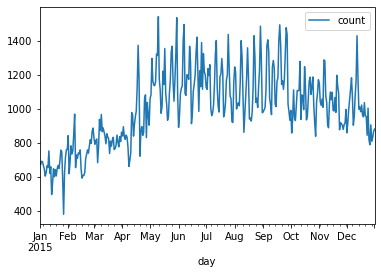

In [171]:
## plotting of the crime count against the date
time_se.plot()

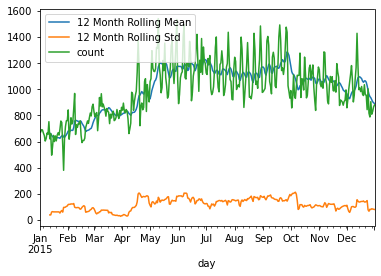

In [172]:
timeseries = time_se['count']
timeseries.rolling(12).mean().plot(label='12 Month Rolling Mean')
timeseries.rolling(12).std().plot(label='12 Month Rolling Std')
timeseries.plot()
plt.legend(loc='best')

<Figure size 432x288 with 0 Axes>

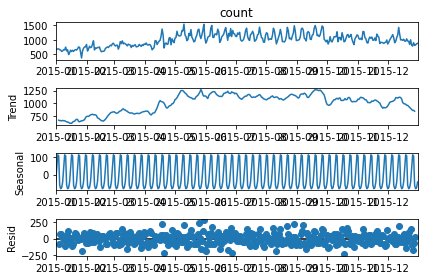

In [173]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(time_se['count'])  
fig = plt.figure()  
fig = decomposition.plot() 

In [174]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(timeseries)
result

(-2.079247645891997,
 0.25294067957638056,
 13,
 351,
 {'1%': -3.44911857009962,
  '5%': -2.8698097654570507,
  '10%': -2.5711757061225153},
 4221.601886007955)

In [175]:
#Mathematically testing stationarity by agumented Dickey-Fuller test
from statsmodels.tsa.stattools import adfuller
#Creating function for later use
def adf_check(time_series):
    """
    Pass in a time series, returns ADF report
    """
    result = adfuller(time_series)
    print('Augmented Dickey-Fuller Test:')
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']

    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis, reject the null hypothesis. Data is stationary")
    else:
        print("weak evidence against null hypothesis, time series is non-stationary ")

In [176]:
adf_check(time_se["count"])

Augmented Dickey-Fuller Test:
ADF Test Statistic : -2.079247645891997
p-value : 0.25294067957638056
#Lags Used : 13
Number of Observations Used : 351
weak evidence against null hypothesis, time series is non-stationary 


In [177]:
time_se['count'].shift(1)

day
2015-01-01      NaN
2015-01-02    675.0
2015-01-03    672.0
2015-01-04    691.0
2015-01-05    689.0
              ...  
2015-12-27    788.0
2015-12-28    905.0
2015-12-29    809.0
2015-12-30    830.0
2015-12-31    865.0
Name: count, Length: 365, dtype: float64

In [178]:
time_se['count_first_diff'] = time_se['count'] - time_se['count'].shift(1)

In [179]:
time_se.head()

,count,count_first_diff
day,,
2015-01-01,675,NaN
2015-01-02,672,-3.0
2015-01-03,691,19.0
2015-01-04,689,-2.0
2015-01-05,665,-24.0


<AxesSubplot:xlabel='day'>

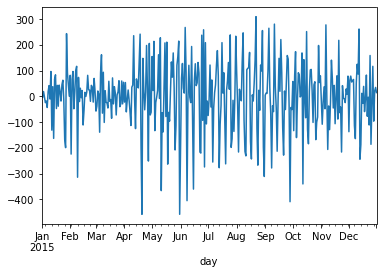

In [180]:
time_se.count_first_diff.plot()

In [181]:
adf_check(time_se['count_first_diff'].dropna())

Augmented Dickey-Fuller Test:
ADF Test Statistic : -9.209768555517952
p-value : 1.9016230790746454e-15
#Lags Used : 12
Number of Observations Used : 351
strong evidence against the null hypothesis, reject the null hypothesis. Data is stationary


# Profiel Report

In [182]:
from pandas_profiling import ProfileReport


In [183]:
profile= ProfileReport(f_read)

In [184]:
profile